# Mathematical Morphology and Histogram manipulations

The aim of this practical work is to get acquainted with mathematical morphology
transformations. Applying different operations with several structuring elements on
simple images will allow you understanding the actions, effects and properties of the
operations, the role of the structuring element, as well as the need for appropriate
pre-processing depending on the application at hand.

In this session, we will mainly focus on functions from the skimage.morphology package.

In [2]:
#Dowmloading images
!wget https://perso.telecom-paristech.fr/rachddou/teaching_material/images.zip
!unzip -qq images.zip 
!rm images.zip
!rm -rf __MACOSX

--2023-11-23 03:43:47--  https://perso.telecom-paristech.fr/rachddou/teaching_material/images.zip
Resolving perso.telecom-paristech.fr (perso.telecom-paristech.fr)... 2a04:8ec0:0:a::89c2:16e3, 137.194.22.227
Connecting to perso.telecom-paristech.fr (perso.telecom-paristech.fr)|2a04:8ec0:0:a::89c2:16e3|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 22981078 (22M) [application/zip]
Saving to: ‘images.zip’

images.zip            0%[                    ]       0  --.-KB/s               

images.zip          100%[===================>]  21.92M  26.9MB/s    in 0.8s    

2023-11-23 03:43:48 (26.9 MB/s) - ‘images.zip’ saved [22981078/22981078]

replace images/bateau.tif? [y]es, [n]o, [A]ll, [N]one, [r]ename: ^C


In [3]:
## imports
import matplotlib.pyplot as plt
import skimage.io as skio
import numpy as np
import skimage.morphology as morpho
student = True

## Mathematical morphology

### The structuring element
The basic idea in mathematical orphology is to probe an image with a simple, pre-defined shape, drawing conclusions on how this shape fits or misses the shapes in the image. This simple "probe" is called the structuring element. For example, it can take the shape of a square, a disk or a diamond, with a predefined radius.

Use the functions of the morpho library to visualize a disk structuring element of radius 3. 

[[0 0 0 1 0 0 0]
 [0 1 1 1 1 1 0]
 [0 1 1 1 1 1 0]
 [1 1 1 1 1 1 1]
 [0 1 1 1 1 1 0]
 [0 1 1 1 1 1 0]
 [0 0 0 1 0 0 0]]


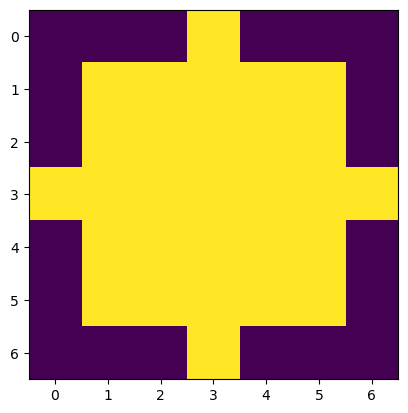

In [4]:
if student :
  strell = morpho.disk(3)

print(strell)
plt.imshow(strell)
plt.show()

Find a way to create a vertical line as a structuring element with parameter length l :

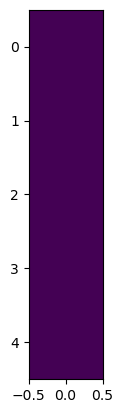

In [5]:
def line_strell(l):
  if student :
    strell = np.ones((l, 1), dtype=np.uint8)
  return(strell)


if student : 
  l = 5
  strell_line = line_strell(l)
  plt.imshow(strell_line)
  plt.show()

### Binary Morphology
In this section, we will work on a cyto-image. Make sure to properly load the "cell.tif" image. Apply a thresholding of level t = 150 to that image to turn it into a binary image. Visualize the result in greyscale, by using the imshow function.

[[159 160 161 ... 138 137 137]
 [160 162 163 ... 137 138 139]
 [161 162 164 ... 139 140 140]
 ...
 [161 161 161 ... 156 155 155]
 [162 162 163 ... 155 154 154]
 [163 162 161 ... 156 156 155]]


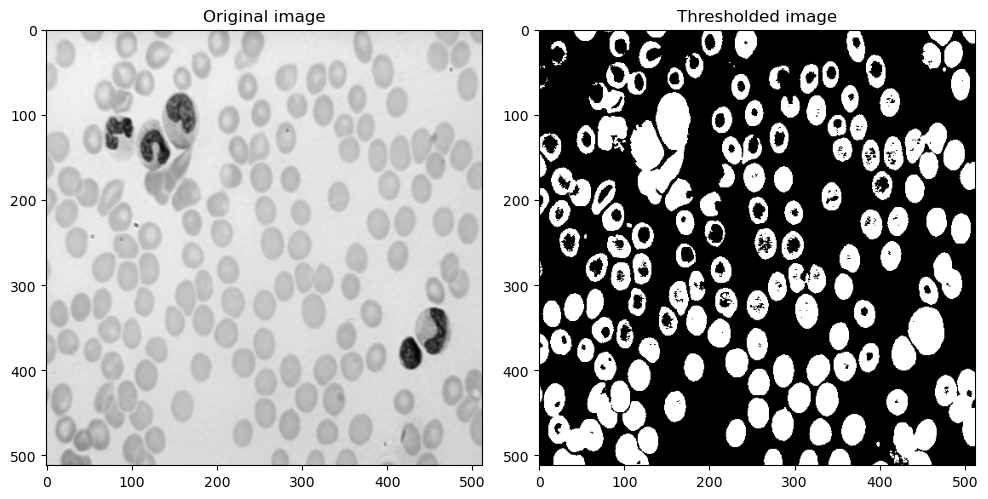

In [24]:
#load the cell image in grayscale and display it 
if student:
  img = skio.imread("images/cell.tif")
  # Theresholding and display
  print(img)
  img_flated = img.flatten()
  for i in range(len(img_flated)):
    if(img_flated[i] >= 150):
      img_flated[i] = 0
    else: img_flated[i] = 1
  
  binary_img = img_flated.reshape(img.shape)
  
  fig,ax = plt.subplots(1,2,figsize=(10, 10))
  ax[0].imshow(img, cmap = "gray")
  ax[0].set_title('Original image')
  ax[1].imshow(binary_img, cmap = "gray")
  ax[1].set_title('Thresholded image')
  fig.tight_layout()


We will first start by applying simple binary morphological operations on those images. You will try the following operations:
- erosion
- dilation
- opening
- closing

You will try to visualize the results by varying the structuring element and its size.  

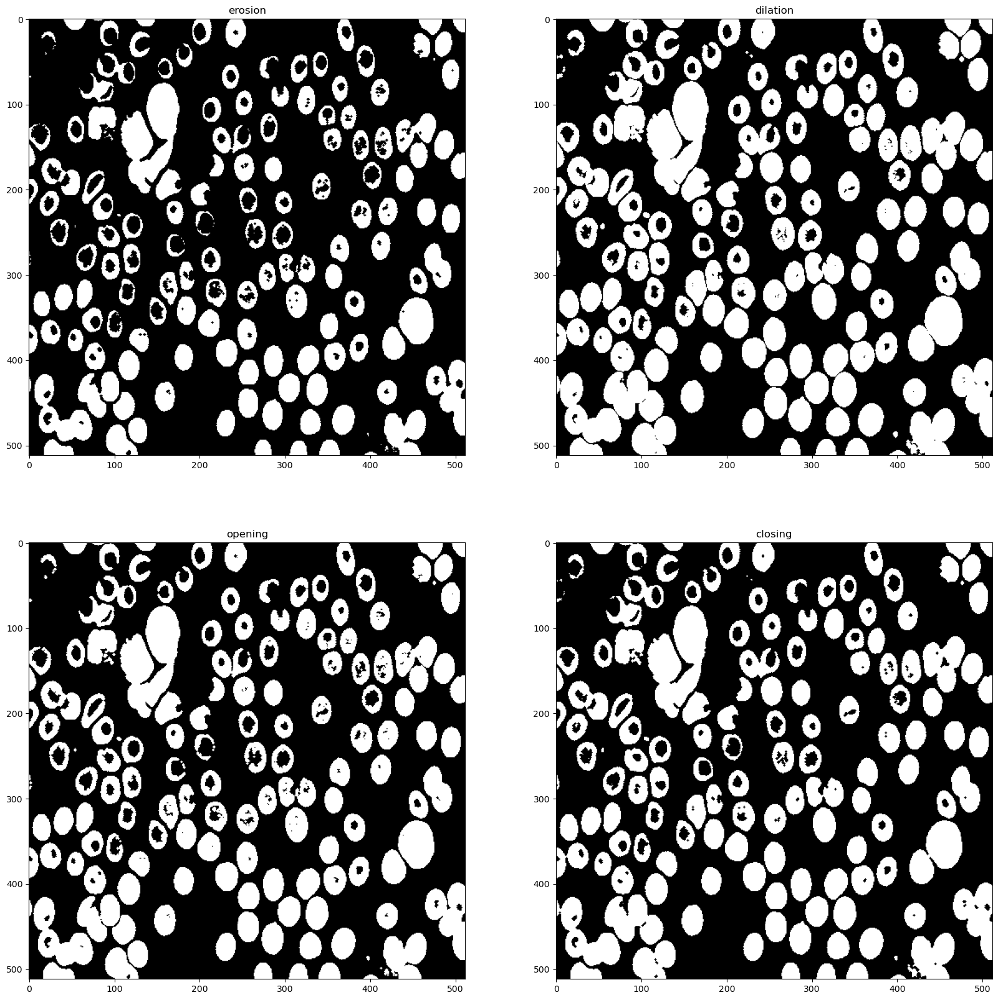

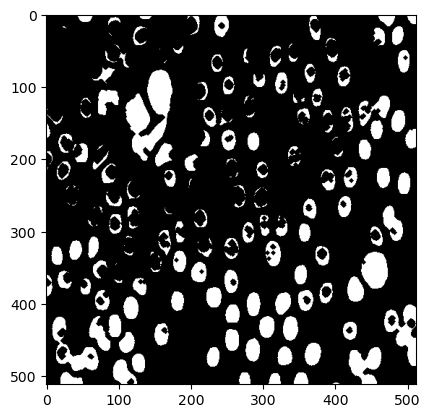

In [7]:
strell = morpho.disk(2)
fig,ax = plt.subplots(2, 2, figsize=(20,20))
erosion = morpho.binary_erosion(binary_img)
dilation = morpho.binary_dilation(binary_img)
opening = morpho.binary_opening(binary_img)
closing = morpho.binary_closing(binary_img)

imgs = [erosion, dilation, opening, closing]
names = ["erosion","dilation","opening","closing"]
for i in range(4):
  ax[i//2,i%2].set_title(names[i])
  ax[i//2,i%2].imshow(imgs[i],cmap = "gray")
plt.show()

# try your own structuring elements and make the size vary
if student :
  strell = morpho.diamond(3)

  erosion = morpho.binary_erosion(binary_img, strell)

  plt.imshow(erosion, cmap = "gray")
  plt.show()

- **Q** : What is the influence of the shape of the structuring element ?
- **A** : 

        For the disk and the diamond, since it's symmetric in all directions, it's more suitable for extracting those cell shapes in the image.
        The shape of the structuring element determines the directional sensitivity of morphological operations.
- **Q** : What is the influence of the size of the structuring element ?
- **A** : 

        The size of the structuring element influences the scale of features that are considered during the operations.
        So small structures are more sensitive to fine details in the image, and vice versa.

### Greyscale Morphology
In this section, we will use the bateau.tif image. Make sure to load it and visualize it in greyscale.


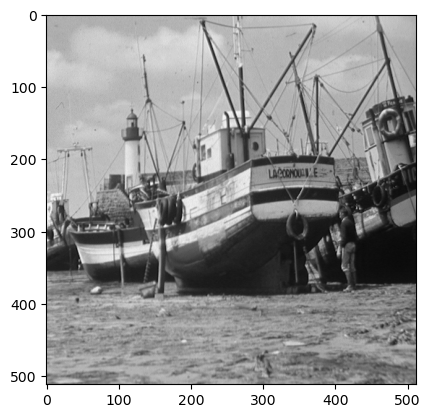

In [8]:
#load the bateau image in grayscale and display it 
if student:
  img = skio.imread("images/bateau.tif")
  plt.imshow(img, cmap = "gray")
  plt.show()

Apply the same 4 operations as before (dilation,erosion,opening,closing) and visualize the results. Try out different structuring elements and different sizes. 

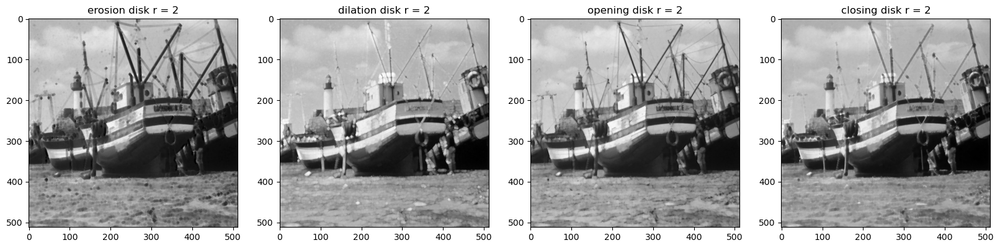

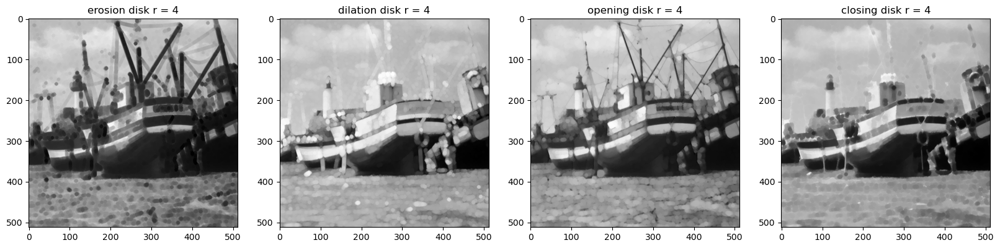

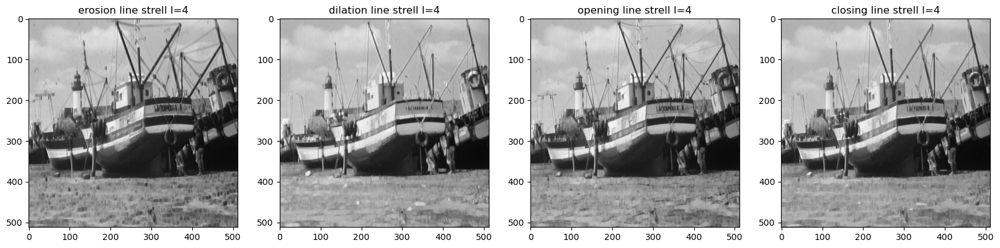

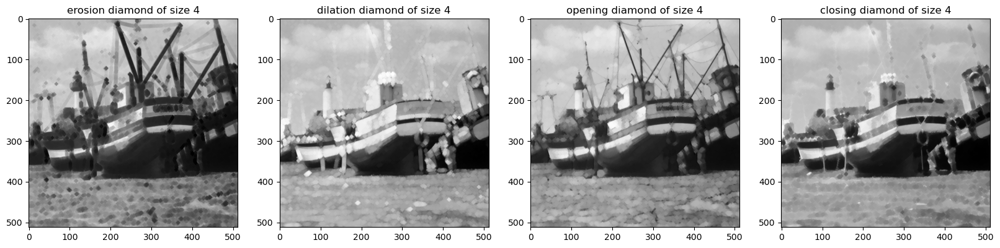

In [9]:
if student:
    strell = morpho.disk(2)
    fig,ax = plt.subplots(1, 4, figsize=(20,20))
    erosion = morpho.erosion(img, strell)
    dilation = morpho.dilation(img, strell)
    opening = morpho.opening(img, strell)
    closing = morpho.closing(img, strell)

    # Footprint  : disk of radius 2
    imgs = [erosion, dilation, opening, closing]
    names = ["erosion disk r = 2","dilation disk r = 2","opening disk r = 2","closing disk r = 2"]
    for i in range(4):
        ax[i].set_title(names[i])
        ax[i].imshow(imgs[i],cmap = "gray")
    plt.show()

    # Footprint  : disk of radius 4
    strell = morpho.disk(4)
    fig,ax = plt.subplots(1, 4, figsize=(20,20))
    erosion = morpho.erosion(img, strell)
    dilation = morpho.dilation(img, strell)
    opening = morpho.opening(img, strell)
    closing = morpho.closing(img, strell)

    imgs = [erosion, dilation, opening, closing]
    names = ["erosion disk r = 4","dilation disk r = 4","opening disk r = 4","closing disk r = 4"]
    for i in range(4):
        ax[i].set_title(names[i])
        ax[i].imshow(imgs[i],cmap = "gray")
    plt.show()

    # Footprint  : line strell of size 6
    strell = line_strell(6)
    fig,ax = plt.subplots(1, 4, figsize=(20,20))
    erosion = morpho.erosion(img, strell)
    dilation = morpho.dilation(img, strell)
    opening = morpho.opening(img, strell)
    closing = morpho.closing(img, strell)

    imgs = [erosion, dilation, opening, closing]
    names = ["erosion line strell l=4","dilation line strell l=4","opening line strell l=4","closing line strell l=4"]
    for i in range(4):
        ax[i].set_title(names[i])
        ax[i].imshow(imgs[i],cmap = "gray")
    plt.show()

    # Footprint  : diamond of size 4
    strell = morpho.diamond(4)
    fig,ax = plt.subplots(1, 4, figsize=(20,20))
    erosion = morpho.erosion(img, strell)
    dilation = morpho.dilation(img, strell)
    opening = morpho.opening(img, strell)
    closing = morpho.closing(img, strell)

    imgs = [erosion, dilation, opening, closing]
    names = ["erosion diamond of size 4","dilation diamond of size 4","opening diamond of size 4","closing diamond of size 4"]
    for i in range(4):
        ax[i].set_title(names[i])
        ax[i].imshow(imgs[i],cmap = "gray")
    plt.show()

- **Q** : What is the influence of the shape and size parameters of the structuring element ?
- **A** : 

        The shape determines the directional sensitivity of morphological operations, guiding the emphasis on certain features or structures.
        The size influences the scale of the neighborhood considered during operations, affecting the level of detail preserved or smoothed.

- **Q** : How can you illustrate the iterativity property of the dilation ? What is the
result of a dilation by a structuring element of size 2 followed by a dilation by a
structuring element of size 3 (and same shape) ? Show your illustration in the next cell.
- **A** : We can see that there's no difference, so the dilation by a stucture of size 2 then 3 is exacltly the dilatation by the same stucture of size 3 + 2.

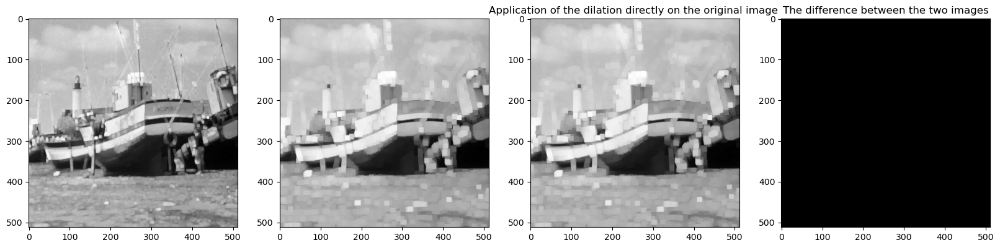

In [10]:
if student:
    strell =  morpho.square(5) # r = 2, in python 
    dilation_2 = morpho.dilation(img, strell)

    strell = morpho.square(7) # r = 3
    dilation_3 = morpho.dilation(dilation_2, strell)

    # Now let's do a dilation with the same shpae of size 3 directly on the orignal image : 
    strell = morpho.square(5*2 + 1) # r = 3 + 2
    dilation3 = morpho.dilation(img, strell)

    sub_image = dilation_3 - dilation3

    fig,ax = plt.subplots(1, 4, figsize=(20,20))
    ax[0].imshow(dilation_2, cmap = "gray")
    ax[1].imshow(dilation_3, cmap = "gray")
    ax[2].imshow(dilation3, cmap = "gray")
    ax[2].set_title("Application of the dilation directly on the original image ")
    ax[3].imshow(sub_image, cmap = "gray")
    ax[3].set_title("The difference between the two images")
    plt.show()


- **Q:** What is the result of an opening by a structuring element of size 2 followed by
an opening by a structuring element of size 3 (and same shape) ? Can you show it experimentally ? Explain.
- **A:** We get exactly the same image, so the opening is equivalent to the opening by the shape with the largest structure.

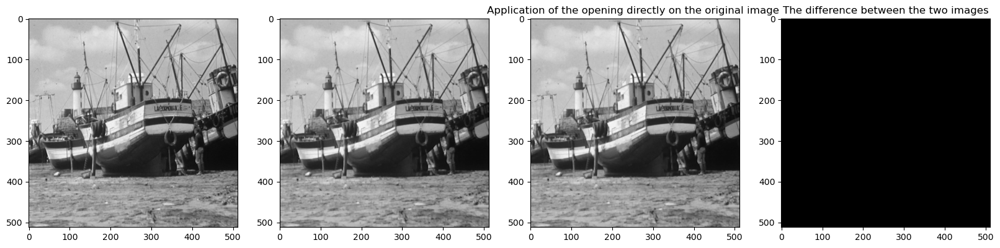

In [11]:
if student :
  strell =  morpho.square(2)
  opening_2 = morpho.opening(img, strell)

  strell = morpho.square(3)
  opening_3 = morpho.opening(opening_2, strell)

  # Now let's do a dilation with the same shpae of size 3 directly on the orignal image : 
  opening3 = morpho.opening(img, strell)

  sub_image = opening_3 - opening3

  fig,ax = plt.subplots(1, 4, figsize=(20,20))
  ax[0].imshow(opening_2, cmap = "gray")
  ax[1].imshow(opening_3, cmap = "gray")
  ax[2].imshow(opening3, cmap = "gray")
  ax[2].set_title("Application of the opening directly on the original image ")
  ax[3].imshow(sub_image, cmap = "gray")
  ax[3].set_title("The difference between the two images")
  plt.show()

- **Q:** How can you illustrate the idempotence of closing ? Show your illustration in the following cell.


        We can apply the closing by the same shape and size more than once and compare the results.
        
        We find that exactly the same image after applying closing by the same structure n times.

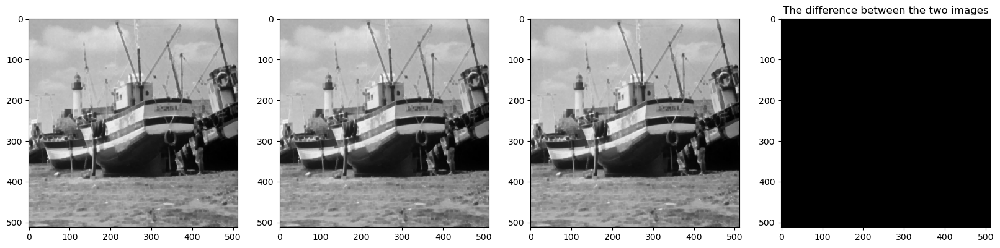

In [12]:
if student :
    strell =  morpho.square(4)
    closing_1 = morpho.closing(img, strell)
    closing_2 = morpho.closing(closing_1, strell)
    closing_3 = morpho.closing(closing_2, strell)
    sub_image = closing_1 - closing_3

    fig,ax = plt.subplots(1, 4, figsize=(20,20))
    ax[0].imshow(closing_1, cmap = "gray")
    ax[1].imshow(closing_2, cmap = "gray")
    ax[2].imshow(closing_3, cmap = "gray")
    ax[3].imshow(sub_image, cmap = "gray")
    ax[3].set_title("The difference between the two images")
    plt.show()

- **Q** : Perform a top-hat transform in the following cell (difference between the image and its opening).
Comment the result depending on the choice of the structuring element.
- **A** :

                We can say that circular structure is good for enhancing circular structures, while the is more suitable for linear structures.

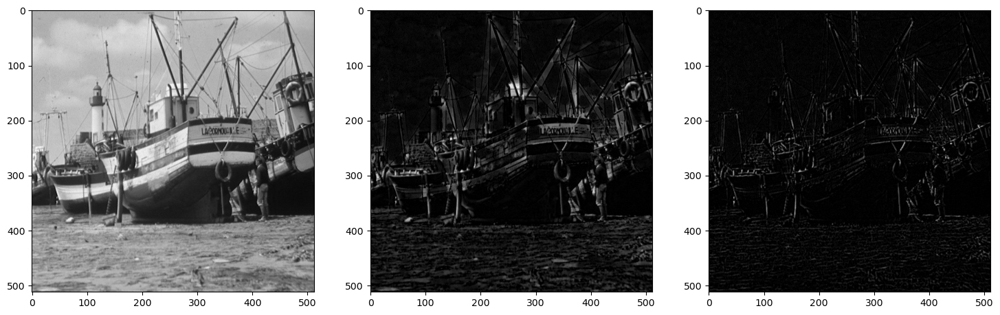

In [13]:
if student:
  ### start code
  strell = morpho.disk(6)
  top_hat = img - morpho.opening(img, strell)

  strell = morpho.square(4)
  top_hat_2 = img - morpho.opening(img, strell)

fig,ax = plt.subplots(1, 3, figsize=(18,18))
ax[0].imshow(img, cmap = "gray")
ax[1].imshow(top_hat, cmap = "gray")
ax[2].imshow(top_hat_2, cmap = "gray")
plt.show()

- **Q** : Perform a dual top-hat transform in the following cell (difference between the closing and the image).
Comment the result depending on the choice of the structuring element.
- **A** : 

        The dual top-hat transform enhances the fine bright details and small bright structures in the image. So by appling the disk structure we can see that we enhace not just the bars above the boat but also some bright part of the boat that are note necessarly just fine lines.

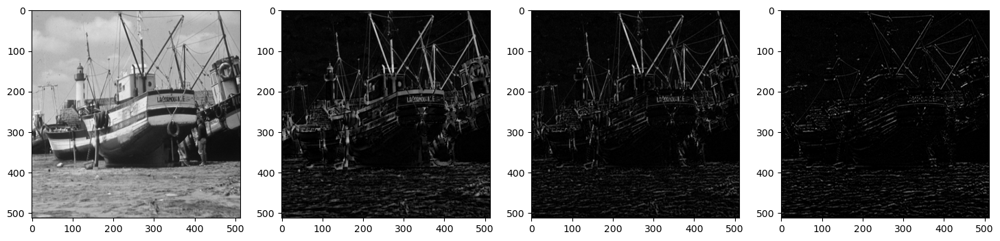

In [14]:
if student:
  ### start code
  strell = morpho.disk(6)
  dual_top_hat = morpho.closing(img, strell) - img

  strell = morpho.square(6)
  dual_top_hat2 = morpho.closing(img, strell) - img

  strell = line_strell(6)
  dual_top_hat3 = morpho.closing(img, strell) - img
  
fig,ax = plt.subplots(1, 4, figsize=(18,18))
ax[0].imshow(img, cmap = "gray")
ax[1].imshow(dual_top_hat, cmap = "gray")
ax[2].imshow(dual_top_hat2, cmap = "gray")
ax[3].imshow(dual_top_hat3, cmap = "gray")

plt.show()

### Alternating Filters
- **Q**: Perform alternate sequential filters, for instance by using the following code and trying out your own combinations. What kind of filtering can be expected from such
operations?
- **A**:...

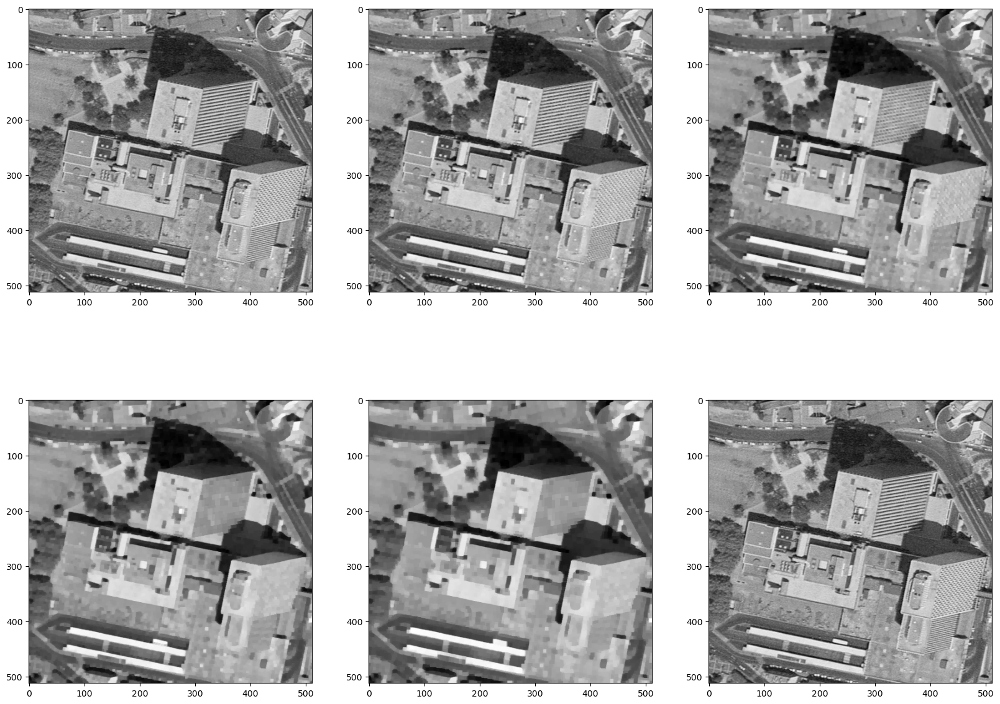

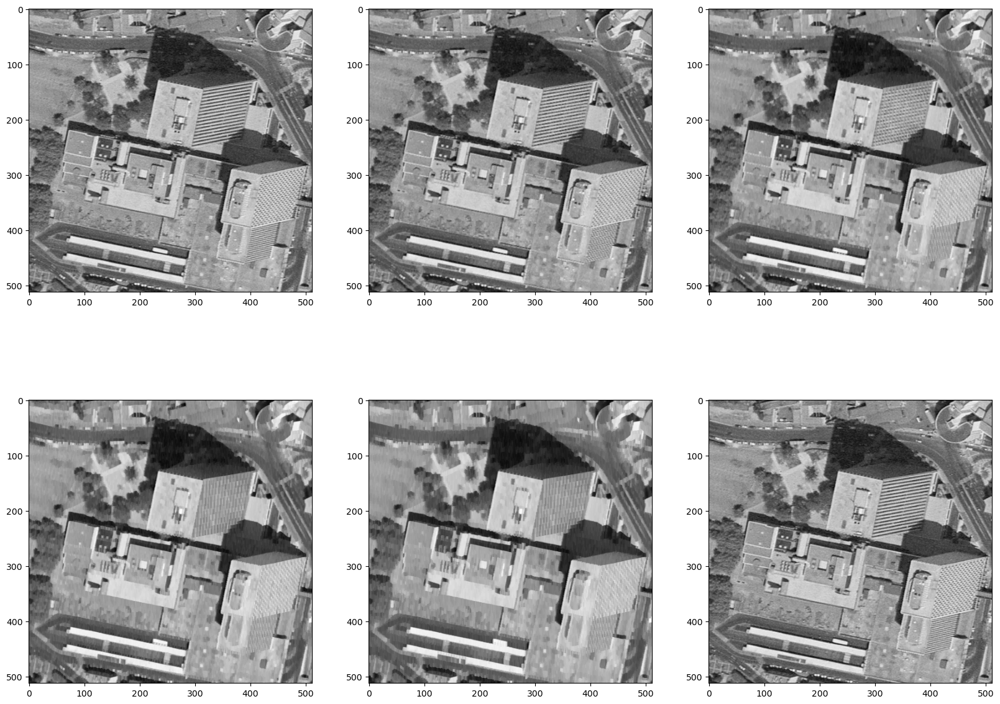

In [15]:
# Example
img = skio.imread("images/montreuil.tif")
se1=morpho.square(1)
se2=morpho.square(2)
se3=morpho.square(3)
se4=morpho.square(4)
se5=morpho.square(5)
fas1=morpho.closing(morpho.opening(img,se1),se1)
fas2=morpho.closing(morpho.opening(fas1,se2),se2)
fas3=morpho.closing(morpho.opening(fas2,se3),se3)
fas4=morpho.closing(morpho.opening(fas3,se4),se4)
fas5=morpho.closing(morpho.opening(fas4,se5),se5)

fig,ax = plt.subplots(2,3,figsize = (20,15))
ax[0,0].imshow(fas1,cmap = "gray")
ax[0,1].imshow(fas2,cmap = "gray")
ax[0,2].imshow(fas3,cmap = "gray")
ax[1,0].imshow(fas4,cmap = "gray")
ax[1,1].imshow(fas5,cmap = "gray")
ax[1,2].imshow(img,cmap = "gray")
plt.show()

if student :

  l1 = line_strell(1)
  l2 = line_strell(2)
  l3 = line_strell(3)
  l4 = line_strell(4)
  l5  = line_strell(5)
  fas1=morpho.closing(morpho.opening(img,l1),l1)
  fas2=morpho.closing(morpho.opening(fas1,l2),l2)
  fas3=morpho.closing(morpho.opening(fas2,l3), l3)
  fas4=morpho.closing(morpho.opening(fas3,l4), l4)
  fas5=morpho.closing(morpho.opening(fas4,l5), l5)

  fig,ax = plt.subplots(2,3,figsize = (20,15))
  ax[0,0].imshow(fas1,cmap = "gray")
  ax[0,1].imshow(fas2,cmap = "gray")
  ax[0,2].imshow(fas3,cmap = "gray")
  ax[1,0].imshow(fas4,cmap = "gray")
  ax[1,1].imshow(fas5,cmap = "gray")
  ax[1,2].imshow(img,cmap = "gray")
  plt.show()

### Segmentation
 - **Q** : Apply a morphological gradient to the image cell.tif (difference between
dilation and erosion with a structuring element of radius1). What do you observe ?

- **A**: (code in the following cell) 

        We observe that the morphological gradient highlights the borders of objects in the image.

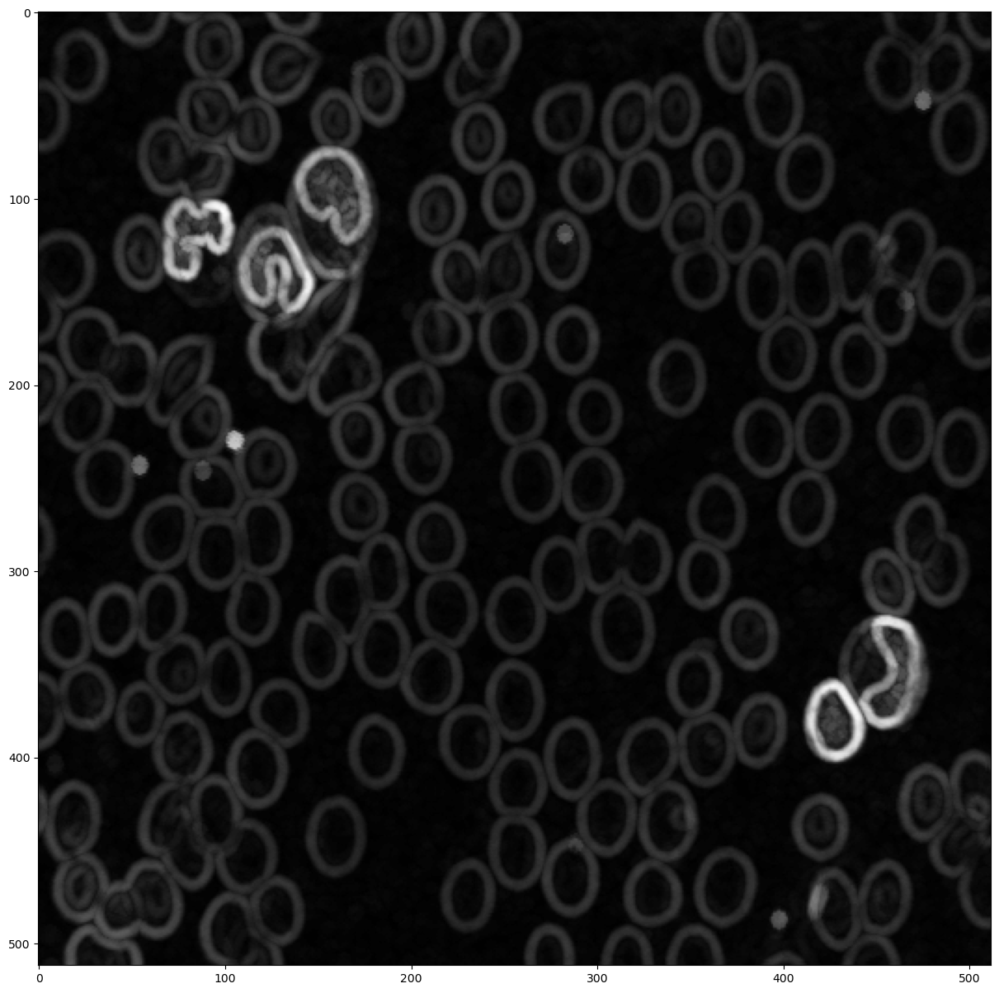

In [32]:
if student :
  img = skio.imread("images/cell.tif")
  strell = morpho.disk(3)
  morpho_grad = morpho.dilation(img, strell) - morpho.erosion(img, strell)

plt.figure(figsize=(15,15))
plt.imshow(morpho_grad,cmap = "gray")
plt.show()

- **Q** : Try to threshold the gradient with a value of 25 for instance. Why is is difficult to find an appropriate threshold value ?
- **A** : (code in the next cell) 

        It can be challenging to find an appropriate threshold value for the gradient due to the following reasons:

        Intensity Variation: The gradient values may vary significantly across different regions of the image. Setting a fixed threshold may not be suitable for capturing these variations, ( dynamic threshold ?, for every region a different suitable threshold )

        Object Size Variation: Objects in the image have different sizes, and a single threshold may not effectively differentiate between small and large structures.

        Image Contrast: The overall contrast of the image can affect the gradient values. In regions with low contrast, finding a threshold that discriminates between object and background is be challenging.

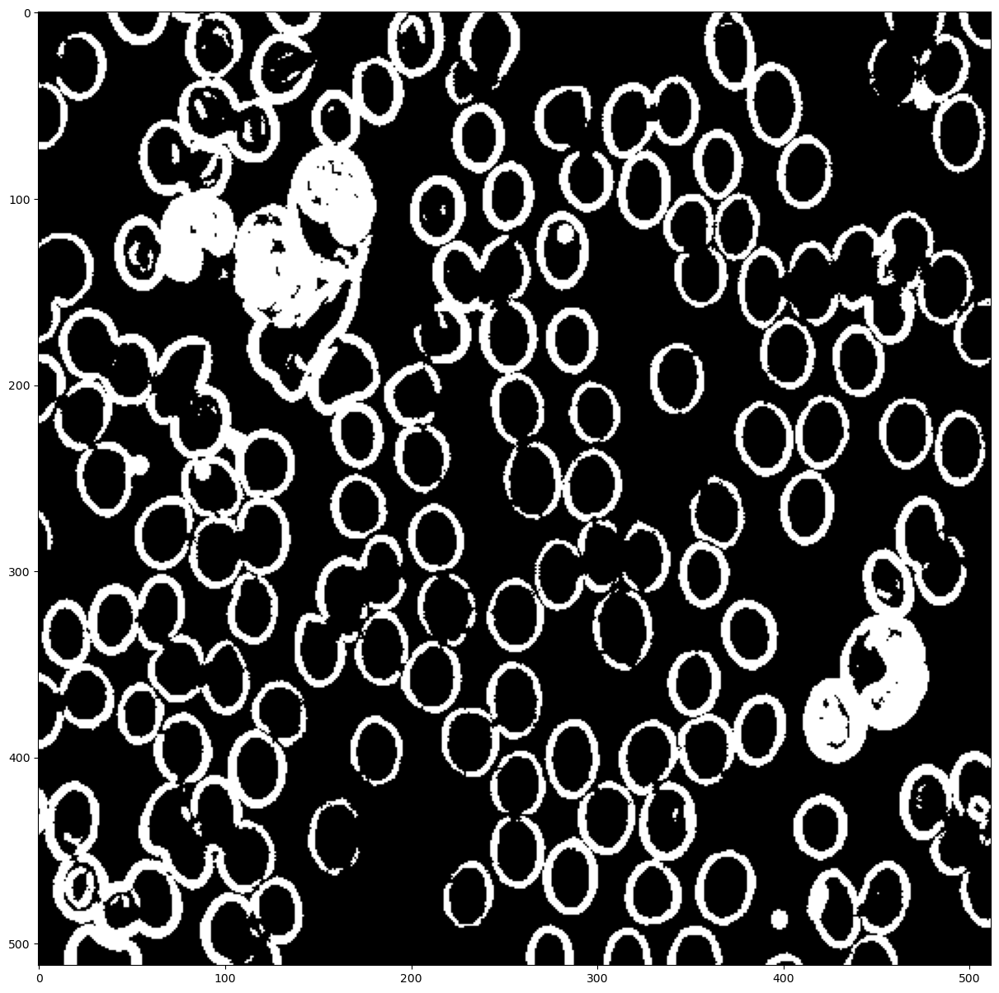

In [30]:
if student :
  thresh = 20
  thresh_grad = np.zeros(morpho_grad.shape[0] * morpho_grad.shape[1])
  img_flatten = morpho_grad.flatten()
  for i in range(len(img_flatten)):
    if img_flatten[i] > thresh:
      thresh_grad[i] = 1
  
  thresh_grad = thresh_grad.reshape(morpho_grad.shape)
  
plt.figure(figsize=(15,15))
plt.imshow(thresh_grad,cmap  ="gray")
plt.show()

- **Q** Apply the watershed algorithm to the gradient image using morpho.watershed(morpho_grad,k) ;
What do you observe ? 
- **A** :(code in the next cell) 

        I observe that the watershed algorithm provides a segmentation of the image.

- **Q** Try to change the parameter k ; what is the role of that parameter ?
- **A** :(code in the next cell) 

        This parameter k plays the role of determining the number of classes or segments in the watershed segmentation. 

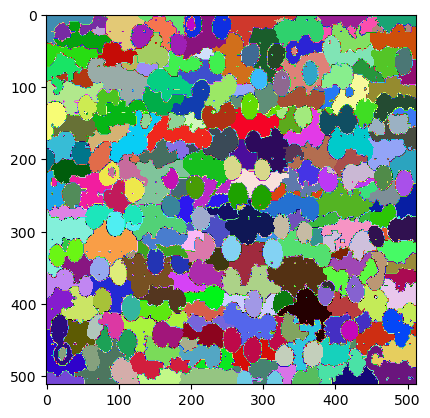

In [18]:
import matplotlib
from skimage.segmentation import watershed

cmaprand = matplotlib.colors.ListedColormap ( np.random.rand ( 256,3))
if student :
  wat = watershed(morpho_grad, 1000)


plt.imshow(wat, cmap =cmaprand)
plt.show()

- **Q** : Apply first a closing on the gradient image and then the watershed. Is the result better ? In which sense and why ?
- **A** : (code in the next cell) 

        The result is better in detecting the boudries of the cells, and the cells in general because the closing resuces the number of local mins.
- **Q** : Apply an opening with the same structuring element on the gradient image and then do a watershed. What is the difference between this operation and the previous? 
- **A** : (code in the next cell) 

        In this case, even when limiting the number of classes, the waltershed algo doesn't succeed to detect the cells.

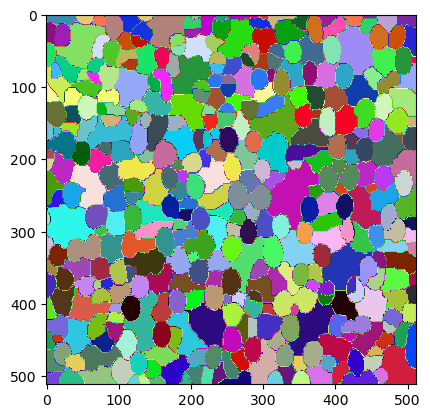

In [19]:
if student :
  struct = morpho.square(7) # l = 3
  wat_closing = watershed(morpho.closing(morpho_grad, struct))


plt.imshow(wat_closing,cmap =cmaprand)
plt.show()

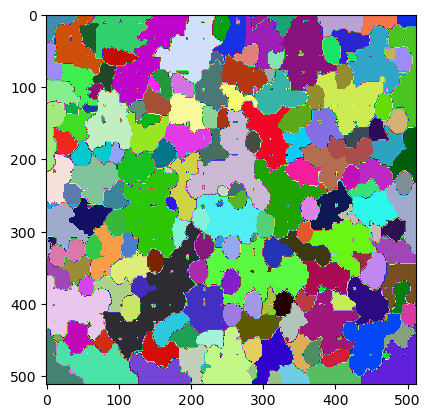

In [20]:
if student :
  wat_opening = watershed(morpho.opening(morpho_grad, struct), 500)


plt.imshow(wat_opening,cmap =cmaprand)
plt.show()

We now propose to try to do better than what you did with the closure and opening by using specific markers for the watershed transform.

**Q** : In the next cell, compute the reconstruction from an opening of the gradient. What do you observe ? Could it help you to efficiently segment the cells ?

**A** : 

        By computing the reconstruction from an opening of the gradient, I observe that the reconstruction emphasizes the bright regions and eliminates smaller dark details. This process is useful for accentuating large, well-defined structures in the image. In the context of cell segmentation, this technique can help in efficiently highlighting the overall shape and boundaries of the cells.

        The reconstruction from opening acts as a morphological operation to enhance and reconstruct the high-intensity areas, which can be beneficial for our application by focusing on the prominent features while suppressing noise and small irregularities.

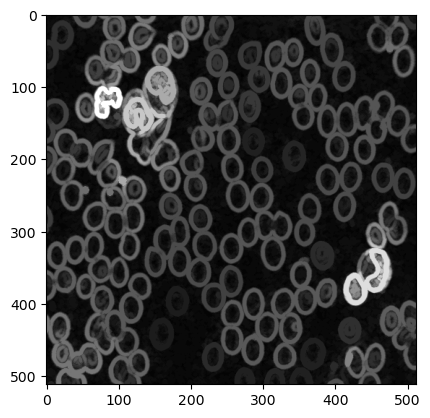

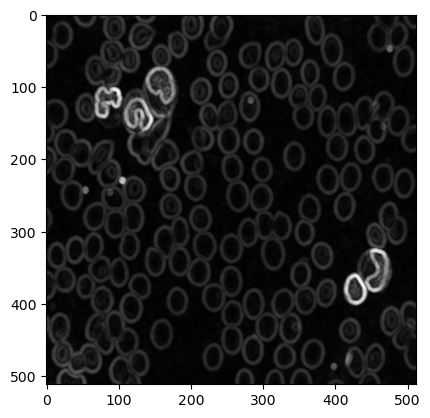

In [21]:
struct = morpho.square(8)
imOpen = morpho.opening(morpho_grad, struct)
reco = morpho.reconstruction(imOpen, mask = morpho_grad, method = 'dilation')


plt.imshow(reco, cmap = "gray")
plt.show()
plt.imshow(morpho_grad, cmap = "gray")
plt.show()

**Q** : In the next cell, compute the reconstruction from an closing of the gradient. What do you observe ? Could it help you to efficiently segment the cells ?

**A** : 

        I observe that the reconstruction emphasizes the dark regions while preserving the larger bright structures. This process is effective in filling in small dark gaps and highlighting the internal structures of objects.

        This technique can be valuable for capturing the internal details and contours of cells. 

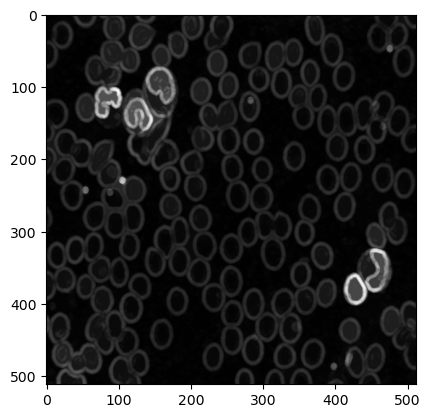

In [22]:
struct = morpho.square(8)
imClos = morpho.closing(morpho_grad, struct)
reco = morpho.reconstruction(imClos, mask = morpho_grad, method = 'erosion')


plt.imshow(reco,cmap = "gray")
plt.show()

**Q** : Use the reconstruction operation and the above questions to find good markers for the watershed algorithm. You could benefit from using the peak_local_max function of skimage.feature

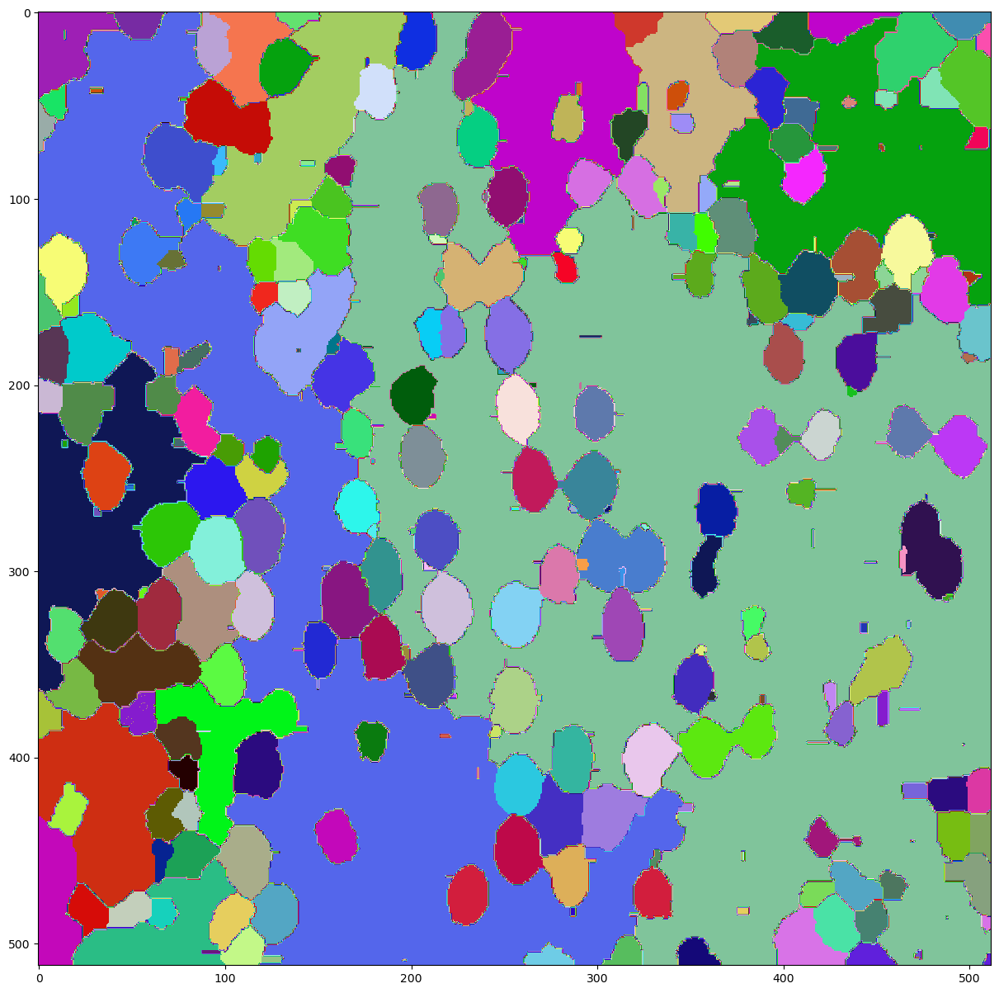

In [23]:
from skimage.feature import peak_local_max
from scipy import ndimage

strell = morpho.disk(15)
imOpen = morpho.opening(morpho_grad, strell)
reco = morpho.reconstruction(imOpen, morpho_grad)


markers_ = peak_local_max(reco, min_distance=20, exclude_border=False)
markers_ = markers_.astype(int)
markers_binary = np.zeros_like(reco, dtype = bool)
markers_binary[markers_[:, 0], markers_[:, 1]] = True
markers_labels, _ = ndimage.label(markers_binary)

wat = watershed(reco, markers= markers_labels)
plt.figure(figsize =(15,15))
plt.imshow(wat,cmap =cmaprand)
plt.show()